# IT Academy - Data Science with Python
## Sprint 11: SkLearn Train Test
### [Github SkLearn Train Test](https://github.com/jesussantana/SkLearn-Train-Test)

[![forthebadge made-with-python](http://ForTheBadge.com/images/badges/made-with-python.svg)](https://www.python.org/)  
[![Made withJupyter](https://img.shields.io/badge/Made%20with-Jupyter-orange?style=for-the-badge&logo=Jupyter)](https://jupyter.org/try)  
[![wakatime](https://wakatime.com/badge/github/jesussantana/SkLearn-Train-Test.svg)](https://wakatime.com/badge/github/jesussantana/SkLearn-Train-Test)  

In [1]:
#%pip install sklearn

In [2]:
import pandas as pd
import numpy as np
import warnings

from sklearn import preprocessing
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split

from matplotlib import pyplot as plt
import seaborn as sns
from PIL import Image
%matplotlib inline

plt.figure(figsize=(16, 6))
warnings.filterwarnings('ignore')
sns.set_theme(style='darkgrid', palette='deep')

<Figure size 1152x432 with 0 Axes>

### Exercise 1: 
  - Split the DelayedFlights.csv dataset into train and test. Study the two sets separately, at a descriptive level.

In [3]:
df_raw = pd.read_csv("../data/raw/DelayedFlights.csv")

In [4]:
df = df_raw.copy()

In [5]:
df.head()

,Unnamed: 0,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,...,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,0,2008,1,3,4,2003.0,1955,2211.0,2225,WN,...,4.0,8.0,0,N,0,NaN,NaN,NaN,NaN,NaN
1,1,2008,1,3,4,754.0,735,1002.0,1000,WN,...,5.0,10.0,0,N,0,NaN,NaN,NaN,NaN,NaN
2,2,2008,1,3,4,628.0,620,804.0,750,WN,...,3.0,17.0,0,N,0,NaN,NaN,NaN,NaN,NaN
3,4,2008,1,3,4,1829.0,1755,1959.0,1925,WN,...,3.0,10.0,0,N,0,2.0,0.0,0.0,0.0,32.0
4,5,2008,1,3,4,1940.0,1915,2121.0,2110,WN,...,4.0,10.0,0,N,0,NaN,NaN,NaN,NaN,NaN


In [6]:
df = df[["ArrTime","Distance","TaxiIn","TaxiOut","DayOfWeek","DepDelay","ArrDelay","CarrierDelay", 'UniqueCarrier']].dropna()

In [7]:
df = df.sample(frac=1).head(10000)

In [8]:
train, test = train_test_split(df,test_size=0.01)

In [9]:
train.shape, test.shape

((9900, 9), (100, 9))

In [10]:
train.describe().round(3)

,ArrTime,Distance,TaxiIn,TaxiOut,DayOfWeek,DepDelay,ArrDelay,CarrierDelay
count,9900.000,9900.000,9900.000,9900.000,9900.000,9900.000,9900.000,9900.000
mean,1610.419,745.493,7.306,20.743,3.953,60.066,63.675,19.912
std,587.375,565.939,5.775,16.753,1.983,60.470,60.868,44.687
min,1.000,31.000,0.000,1.000,1.000,6.000,15.000,0.000
25%,1318.000,331.750,4.000,11.000,2.000,24.000,26.000,0.000
50%,1732.000,595.000,6.000,16.000,4.000,41.000,43.000,2.000
75%,2048.000,980.250,8.000,24.000,6.000,76.000,80.000,21.000
max,2400.000,4962.000,103.000,300.000,7.000,1101.000,1072.000,1072.000


In [11]:
test.describe().round(3)

,ArrTime,Distance,TaxiIn,TaxiOut,DayOfWeek,DepDelay,ArrDelay,CarrierDelay
count,100.00,100.000,100.000,100.000,100.000,100.000,100.000,100.000
mean,1539.12,727.960,7.570,20.110,3.940,53.290,58.300,15.600
std,605.87,517.656,4.802,14.988,2.141,45.221,46.474,30.081
min,2.00,76.000,2.000,6.000,1.000,7.000,15.000,0.000
25%,1320.50,335.500,4.750,11.000,2.000,23.750,28.250,0.000
50%,1651.00,606.000,6.000,15.500,4.000,40.000,44.500,5.000
75%,2023.00,972.000,8.250,24.000,6.000,69.000,77.000,17.250
max,2340.00,2586.000,24.000,113.000,7.000,314.000,314.000,199.000


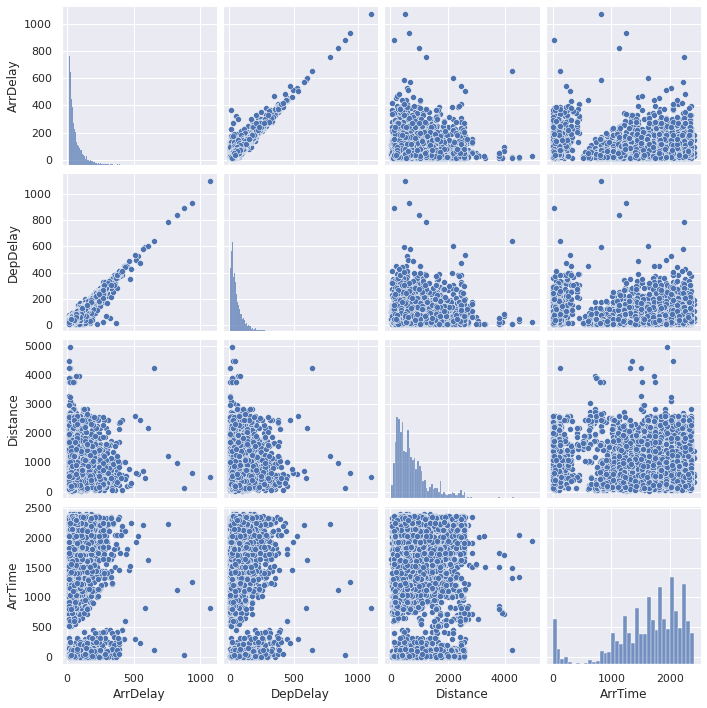

In [12]:
sns.pairplot(train[['ArrDelay', 'DepDelay', 'Distance', 'ArrTime']])

In [13]:
plt.savefig("../reports/figures/train_pairplot.png")

<Figure size 432x288 with 0 Axes>

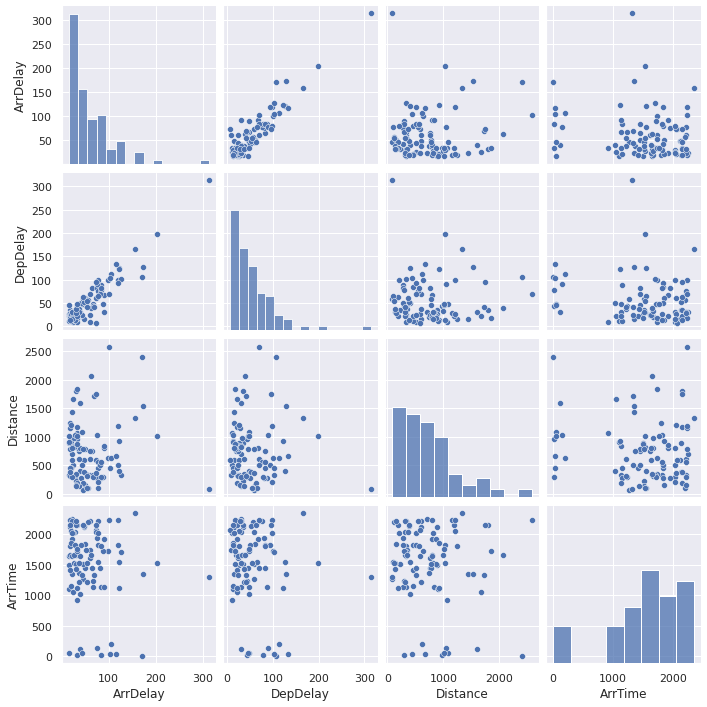

In [14]:
sns.pairplot(test[['ArrDelay', 'DepDelay', 'Distance', 'ArrTime']])

In [15]:
plt.savefig("../reports/figures/test_pairplot.png")

<Figure size 432x288 with 0 Axes>

In [16]:
train.to_csv("../data/interim/train.csv")
test.to_csv("../data/interim/test.csv")

### Exercise 2: 
  - Apply some transformation process (standardize numerical data, create dummy columns, polynomials.

- Create by dummies

In [17]:
df_encoded = pd.get_dummies(df, columns=['UniqueCarrier'], prefix='', drop_first=False, prefix_sep='')

In [18]:
df_encoded.head()

,ArrTime,Distance,TaxiIn,TaxiOut,DayOfWeek,DepDelay,ArrDelay,CarrierDelay,9E,AA,...,HA,MQ,NW,OH,OO,UA,US,WN,XE,YV
1710763,2119.0,1119,9.0,29.0,3,58.0,64.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
1503546,5.0,806,5.0,12.0,7,33.0,25.0,25.0,0,1,...,0,0,0,0,0,0,0,0,0,0
901441,907.0,389,7.0,9.0,1,15.0,17.0,10.0,0,0,...,0,0,0,0,0,0,0,1,0,0
1062676,1707.0,1237,3.0,17.0,7,35.0,42.0,8.0,0,0,...,0,0,0,0,0,0,0,0,0,0
1770934,1738.0,293,3.0,6.0,2,34.0,28.0,4.0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [19]:
columns =["ArrTime","Distance","TaxiIn","TaxiOut","DayOfWeek","DepDelay","ArrDelay","CarrierDelay"]

<AxesSubplot:ylabel='Count'>

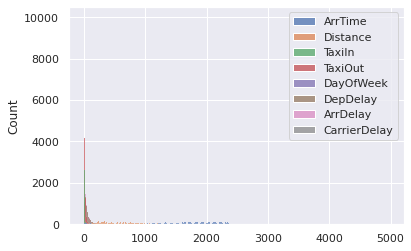

In [20]:
sns.histplot(df_encoded[columns])

In [21]:
plt.savefig("../reports/figures/columns_histplot.png")

<Figure size 432x288 with 0 Axes>

- Scale by standardization

In [22]:
df = pd.DataFrame(preprocessing.scale(df_encoded[columns]),columns=columns)
df

,ArrTime,Distance,TaxiIn,TaxiOut,DayOfWeek,DepDelay,ArrDelay,CarrierDelay
0,0.866816,0.660885,0.293296,0.493765,-0.480132,-0.033117,0.006238,-0.445865
1,-2.731204,0.107321,-0.400526,-0.522077,1.535325,-0.447468,-0.635863,0.115132
2,-1.196003,-0.630174,-0.053615,-0.701344,-1.487861,-0.745801,-0.767576,-0.221466
3,0.165594,0.869577,-0.747437,-0.223300,1.535325,-0.414320,-0.355973,-0.266346
4,0.218356,-0.799957,-0.747437,-0.880610,-0.983996,-0.430894,-0.586471,-0.356105
...,...,...,...,...,...,...,...,...
9995,-0.692212,-0.184493,-0.053615,0.434010,0.023732,1.011049,1.059943,-0.041947
9996,0.922982,1.490346,-0.400526,-0.522077,1.031460,-0.364598,-0.438294,0.384411
9997,0.235376,-1.010417,0.813662,-0.581833,-0.983996,1.143642,1.109336,-0.445865
9998,0.844690,0.130313,-0.573982,-0.462322,-1.487861,1.292808,0.994087,-0.445865


In [23]:
df.std(axis = 0)

ArrTime         1.00005
Distance        1.00005
TaxiIn          1.00005
TaxiOut         1.00005
DayOfWeek       1.00005
DepDelay        1.00005
ArrDelay        1.00005
CarrierDelay    1.00005
dtype: float64

In [24]:
df.iloc[2]

ArrTime        -1.196003
Distance       -0.630174
TaxiIn         -0.053615
TaxiOut        -0.701344
DayOfWeek      -1.487861
DepDelay       -0.745801
ArrDelay       -0.767576
CarrierDelay   -0.221466
Name: 2, dtype: float64

### Exercise 3: 
  - Summarize the new columns generated statistically and graphically

In [25]:
df.describe().round(3)

,ArrTime,Distance,TaxiIn,TaxiOut,DayOfWeek,DepDelay,ArrDelay,CarrierDelay
count,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000
mean,-0.000,0.000,-0.000,0.000,-0.000,0.000,0.000,0.000
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
min,-2.738,-1.263,-1.268,-1.179,-1.488,-0.895,-0.801,-0.446
25%,-0.496,-0.731,-0.574,-0.582,-0.984,-0.597,-0.619,-0.446
50%,0.208,-0.266,-0.227,-0.283,0.024,-0.315,-0.340,-0.401
75%,0.746,0.415,0.120,0.195,1.031,0.265,0.270,0.025
max,1.345,7.458,16.598,16.687,1.535,17.254,16.602,23.610


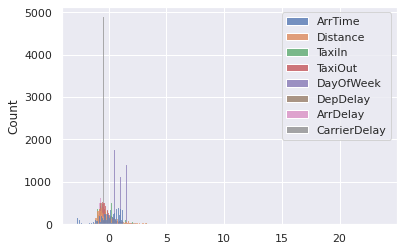

In [28]:
sns.histplot(df)
plt.savefig("../reports/figures/Flights_histplot.png")

In [32]:
 # sns.pairplot(df)
 # plt.savefig("../reports/figures/Flights_pairplot.png")

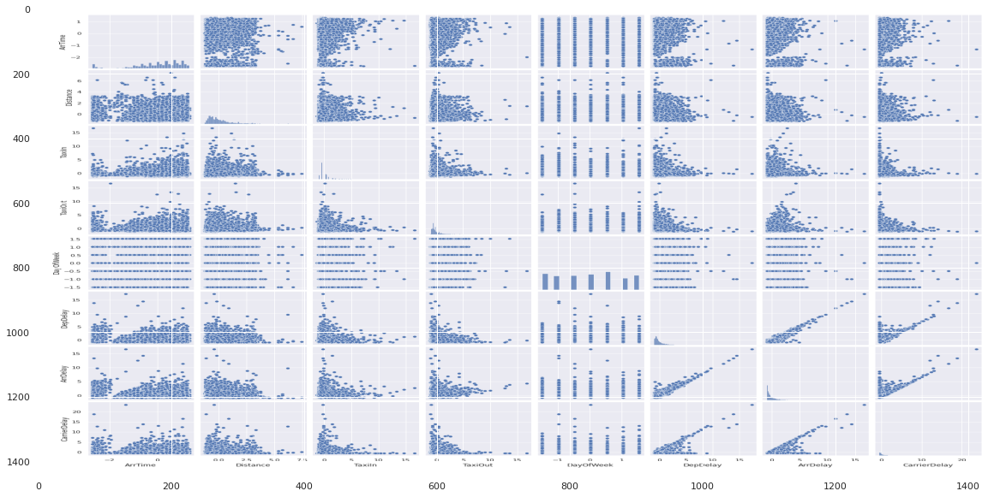

In [40]:
fig = plt.figure()
fig.set_size_inches(20,10)
image = Image.open('../reports/figures/Flights_pairplot.png')
plt.imshow(image, aspect='auto')

In [34]:
df.to_csv("../data/processed/DelayedFlightsProcessed.csv")